# Project: Music Recommendation System using Spotify.

## Team:
    
#### 1. Devdutt Sharma
#### 2. Taylor Furry
#### 3. Yi Chin Tzou
#### 4. Scott Matsubara
#### 5. Sanket Mayekar

-----------------------------------

## About the data:

This is a dataset of Spotify tracks over a range of 125 different genres. Each track has some audio features associated with it. 

### Column Description

**1. track_id:** The Spotify ID for the track


**2. artists:** The artists' names who performed the track. If there is more than one artist, they are separated by a ;


**3. album_name:** The album name in which the track appears


**4. track_name:** Name of the track


**5. popularity:** The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are. Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently. Artist and album popularity is derived mathematically from track popularity.


**6. duration_ms:** The track length in milliseconds


**7. explicit:** Whether or not the track has explicit lyrics (true = yes it does; false = no it does not OR unknown)


**8. danceability:** Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable


**9. energy:** Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale


**10. key:** The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1


**11. loudness:** The overall loudness of a track in decibels (dB)


**12. mode:** Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0


**13. speechiness:** Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks


**14. acousticness:** A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic


**15. instrumentalness:** Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content


**16. liveness:** Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live


**17. valence:** A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry)


**18. tempo:** The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration


**19. time_signature:** An estimated time signature. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). The time signature ranges from 3 to 7 indicating time signatures of 3/4, to 7/4.


**20. track_genre:** The genre in which the track belongs

---------------------------------

# Step 1: Read dataset

#### Import packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer

pd.set_option('display.max_columns', None)
# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

#ignore warning messages 
import warnings
warnings.filterwarnings('ignore')

In [2]:
from scipy.stats import iqr, norm

#### Import Dataset

In [132]:
spotify = pd.read_csv('dataset.csv')

#### Show first 5 observations

In [4]:
spotify.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


#### Show last 5 observations

In [5]:
spotify.tail()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
113995,113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.235,5,-16.393,1,0.0422,0.640,0.928,0.0863,0.0339,125.995,5,world-music
113996,113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.117,0,-18.318,0,0.0401,0.994,0.976,0.1050,0.0350,85.239,4,world-music
113997,113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.329,0,-10.895,0,0.0420,0.867,0.000,0.0839,0.7430,132.378,4,world-music
113998,113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.506,7,-10.889,1,0.0297,0.381,0.000,0.2700,0.4130,135.960,4,world-music
113999,113999,2hETkH7cOfqmz3LqZDHZf5,Cesária Evora,Miss Perfumado,Barbincor,22,241826,False,0.526,0.487,1,-10.204,0,0.0725,0.681,0.000,0.0893,0.7080,79.198,4,world-music


---------------------

# Step 2: Exploratory Data Analysis (EDA)

## 1. Univariate Analysis

####  Get shape of the DataFrame

In [6]:
spotify.shape

(114000, 21)

#### Get data types

In [7]:
spotify.dtypes

Unnamed: 0            int64
track_id             object
artists              object
album_name           object
track_name           object
popularity            int64
duration_ms           int64
explicit               bool
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature        int64
track_genre          object
dtype: object

#### Get data information

In [8]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

#### Check missing values

In [9]:
spotify.isnull().values.any()

True

In [10]:
spotify.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

#### The "artists", "album_name", and "track_name" columns each have one missing value. Therefore, we think it is better we drop  these rows.

In [11]:
spotify[spotify['artists'].isnull()]

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,7,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


In [12]:
spotify.dropna(inplace = True)

In [13]:
spotify.isnull().sum()

Unnamed: 0          0
track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

#### We will drop columns 'Unnamed: 0'

In [14]:
spotify.drop(columns = ['Unnamed: 0'], inplace = True)

#### Convert  'explicit'  from a bool to numerical by replacing True with 1 and False with 0

In [15]:
spotify['explicit'] = spotify['explicit'].replace({True: 1, False: 0})

In [16]:
spotify.shape

(113999, 20)

In [17]:
spotify['track_id'].nunique()

89740

In [18]:
spotify['track_id'].value_counts()

6S3JlDAGk3uu3NtZbPnuhS    9
2Ey6v4Sekh3Z0RUSISRosD    8
2kkvB3RNRzwjFdGhaUA0tz    8
08kTa3SL9sV6Iy8KLKtGql    7
4XYieGKSlJlHpzB3bl6WMP    7
                         ..
0kJ7eKX6aWl8X1W5Xrosn6    1
4bYH5445Bn2w9UiGM0NxQw    1
1T5C6ENvpM3IiYeezsK9uI    1
34SatKRJgtXfL0bcgk7HMA    1
2hETkH7cOfqmz3LqZDHZf5    1
Name: track_id, Length: 89740, dtype: int64

In [19]:
spotify['track_genre'].value_counts()

acoustic             1000
afrobeat             1000
psych-rock           1000
progressive-house    1000
power-pop            1000
                     ... 
emo                  1000
electronic           1000
electro              1000
world-music          1000
k-pop                 999
Name: track_genre, Length: 114, dtype: int64

#### We observed that there are duplicate track IDs

In [20]:
spotify[spotify['track_id'] == '6S3JlDAGk3uu3NtZbPnuhS']

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
8315,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,blues
19759,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,country
34728,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,folk
62226,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,j-pop
63087,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,j-rock
82064,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,power-pop
84129,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,psych-rock
99727,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,singer-songwriter
102732,6S3JlDAGk3uu3NtZbPnuhS,Badfinger,Straight Up (Remastered 2010 / Deluxe Edition),Baby Blue - Remastered 2010,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,songwriter


In [21]:
spotify['track_genre'].value_counts()

acoustic             1000
afrobeat             1000
psych-rock           1000
progressive-house    1000
power-pop            1000
                     ... 
emo                  1000
electronic           1000
electro              1000
world-music          1000
k-pop                 999
Name: track_genre, Length: 114, dtype: int64

#### There are 1000 track of each genre in the dataset.

####  5 number summary

In [22]:
spotify.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,113999.0,33.238827,22.304959,0.000,17.0000,35.000000,50.0000,100.000
duration_ms,113999.0,228031.153387,107296.057716,8586.000,174066.0000,212906.000000,261506.0000,5237295.000
explicit,113999.0,0.085501,0.279627,0.000,0.0000,0.000000,0.0000,1.000
danceability,113999.0,0.566801,0.173543,0.000,0.4560,0.580000,0.6950,0.985
energy,113999.0,0.641383,0.251530,0.000,0.4720,0.685000,0.8540,1.000
key,113999.0,5.309126,3.559999,0.000,2.0000,5.000000,8.0000,11.000
loudness,113999.0,-8.258950,5.029357,-49.531,-10.0130,-7.004000,-5.0030,4.532
mode,113999.0,0.637558,0.480708,0.000,0.0000,1.000000,1.0000,1.000
speechiness,113999.0,0.084652,0.105733,0.000,0.0359,0.048900,0.0845,0.965
acousticness,113999.0,0.314907,0.332522,0.000,0.0169,0.169000,0.5975,0.996


### Visualization for understanding and analysing the distribution of data for different variables

Let us look at the variables using histogram, boxplot, and distplot

In [23]:
numerical = spotify.select_dtypes(include='number').columns.tolist()

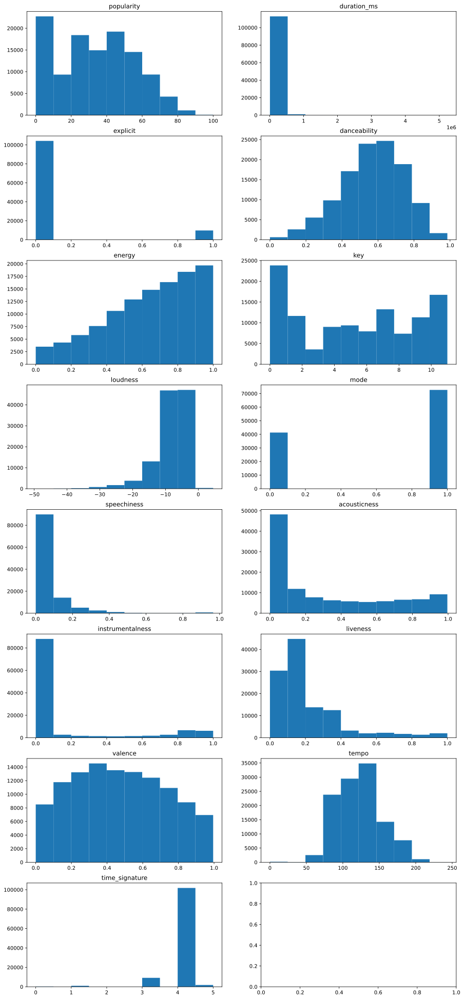

In [24]:
fig, ax = plt.subplots(8, 2, figsize=(15,35))

for i,j in enumerate(numerical):
    k = i//2
    l = i%2
    ax[k,l].hist(spotify[j], density = False)
    ax[k,l].set_title(j)
    
plt.show()

array([[<AxesSubplot: title={'center': 'popularity'}>,
        <AxesSubplot: title={'center': 'duration_ms'}>,
        <AxesSubplot: title={'center': 'explicit'}>,
        <AxesSubplot: title={'center': 'danceability'}>],
       [<AxesSubplot: title={'center': 'energy'}>,
        <AxesSubplot: title={'center': 'key'}>,
        <AxesSubplot: title={'center': 'loudness'}>,
        <AxesSubplot: title={'center': 'mode'}>],
       [<AxesSubplot: title={'center': 'speechiness'}>,
        <AxesSubplot: title={'center': 'acousticness'}>,
        <AxesSubplot: title={'center': 'instrumentalness'}>,
        <AxesSubplot: title={'center': 'liveness'}>],
       [<AxesSubplot: title={'center': 'valence'}>,
        <AxesSubplot: title={'center': 'tempo'}>,
        <AxesSubplot: title={'center': 'time_signature'}>,
        <AxesSubplot: >]], dtype=object)

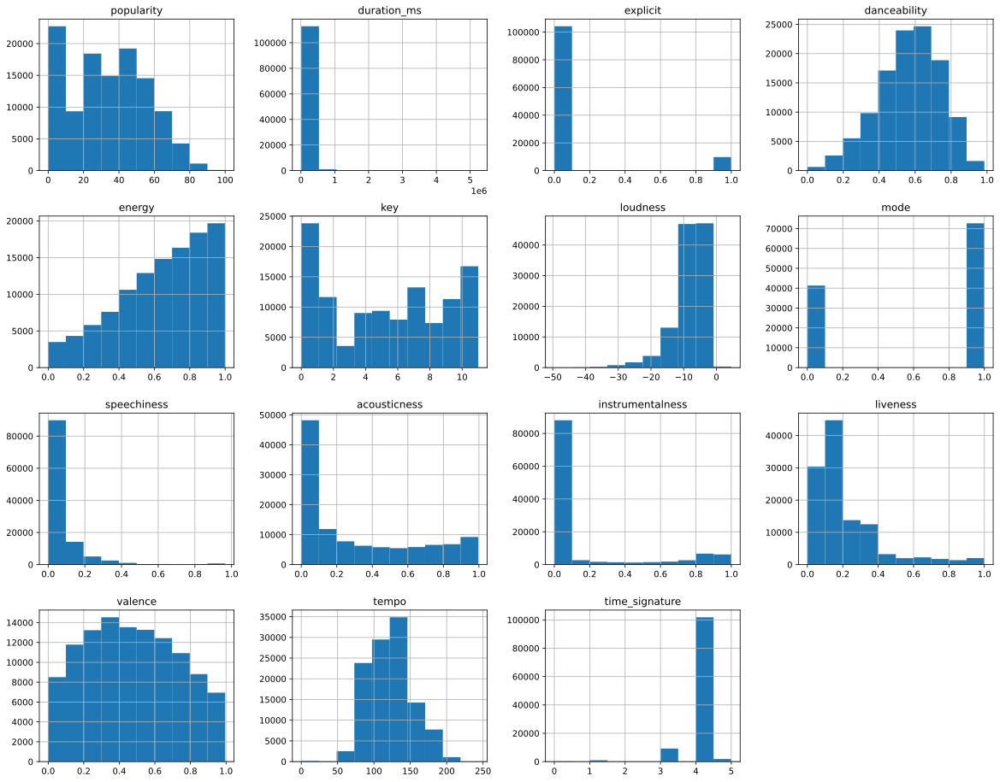

In [25]:
spotify.hist(figsize = (20, 16), grid = True)

In [26]:
spotify.plot(kind = 'box', subplots = True, layout = (4, 4), sharex = False, sharey = False, figsize = (15, 15))
sns.set(font_scale = 1.5)

### KDE plots

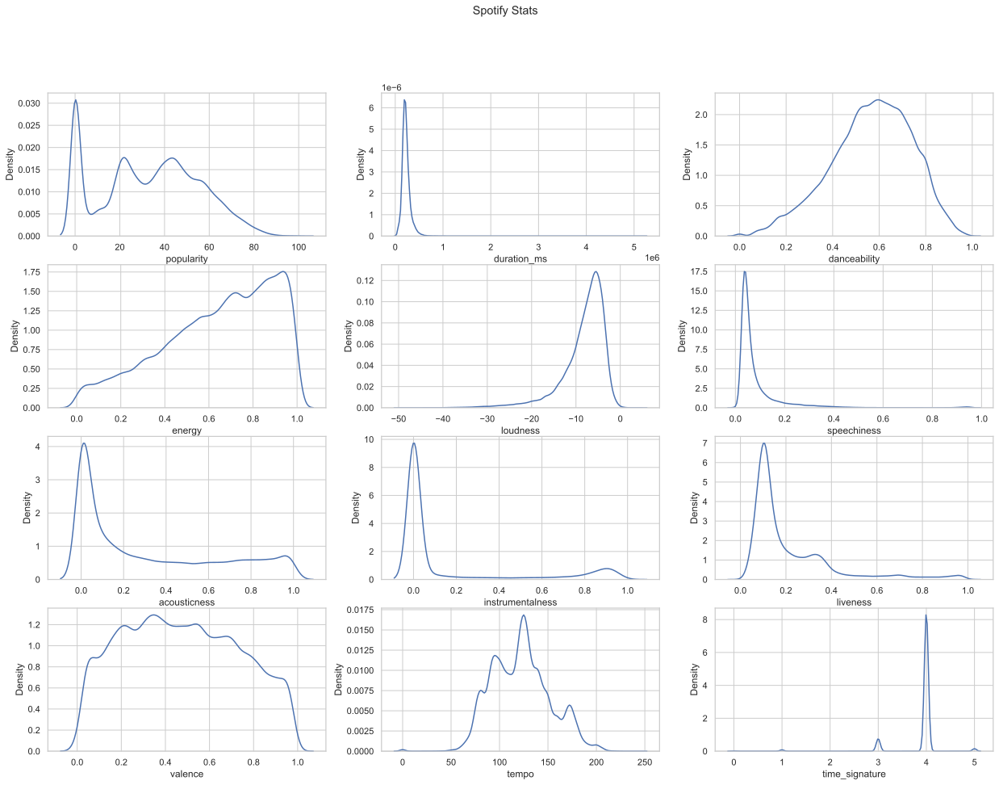

In [27]:
sns.set(style = "whitegrid")
fig, axes = plt.subplots(4, 3, figsize=(21, 15))

fig.suptitle('Spotify Stats')

sns.kdeplot(ax=axes[0, 0], data=spotify, x='popularity')
sns.kdeplot(ax=axes[0, 1], data=spotify, x='duration_ms')
sns.kdeplot(ax=axes[0, 2], data=spotify, x='danceability')
sns.kdeplot(ax=axes[1, 0], data=spotify, x='energy')
sns.kdeplot(ax=axes[1, 1], data=spotify, x='loudness')
sns.kdeplot(ax=axes[1, 2], data=spotify, x='speechiness')
sns.kdeplot(ax=axes[2, 0], data=spotify, x='acousticness')
sns.kdeplot(ax=axes[2, 1], data=spotify, x='instrumentalness')
sns.kdeplot(ax=axes[2, 2], data=spotify, x='liveness')
sns.kdeplot(ax=axes[3, 0], data=spotify, x='valence')
sns.kdeplot(ax=axes[3, 1], data=spotify, x='tempo')
sns.kdeplot(ax=axes[3, 2], data=spotify, x='time_signature')
plt.show()

In [28]:
plt.figure(figsize=(22,20))
sns.set(font_scale = 1.5)
sns.set(style = "whitegrid")

plt.subplot(4,4,1)
sns.distplot(spotify.popularity, color = 'orange', rug = True, fit = norm)
plt.axvline(spotify['popularity'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,2)
sns.distplot(spotify.duration_ms, color = 'red', rug = True, fit = norm)
plt.axvline(spotify['duration_ms'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,3)
sns.distplot(spotify.danceability, color = 'seagreen', rug = True, fit = norm)
plt.axvline(spotify['danceability'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,4)
sns.distplot(spotify.energy, color = 'purple', rug = True, fit = norm)
plt.axvline(spotify['energy'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,5)
sns.distplot(spotify.key, color = 'deeppink', rug = True, fit = norm)
plt.axvline(spotify['key'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,6)
sns.distplot(spotify.loudness, color = 'orangered', rug = True, fit = norm)
plt.axvline(spotify['loudness'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,7)
sns.distplot(spotify.acousticness, color = 'navy', rug = True, fit = norm)
plt.axvline(spotify['acousticness'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,8)
sns.distplot(spotify.liveness, color = 'darkorchid', rug = True, fit = norm)
plt.axvline(spotify['liveness'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,9)
sns.distplot(spotify.instrumentalness, color = 'blue', rug = True, fit = norm)
plt.axvline(spotify['instrumentalness'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,10)
sns.distplot(spotify.liveness, color = 'brown', rug = True, fit = norm)
plt.axvline(spotify['liveness'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,11)
sns.distplot(spotify.valence, color = 'maroon', rug = True, fit = norm)
plt.axvline(spotify['valence'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,12)
sns.distplot(spotify.tempo, color = 'blue', rug = True, fit = norm)
plt.axvline(spotify['tempo'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

plt.subplot(4,4,13)
sns.distplot(spotify.time_signature, color = 'brown', rug = True, fit = norm)
plt.axvline(spotify['time_signature'].mean(), linestyle = "dashed", label = 'mean', color = 'k')
plt.legend()

Error in callback <function flush_figures at 0x7f9d90854280> (for post_execute):


KeyboardInterrupt: 

## ARTIST

In [33]:
n = spotify['artists'].nunique()

from collections import Counter

c = Counter(spotify['artists'])
c.most_common(n)[:10]

[('The Beatles', 279),
 ('George Jones', 271),
 ('Stevie Wonder', 236),
 ('Linkin Park', 224),
 ('Ella Fitzgerald', 222),
 ('Prateek Kuhad', 217),
 ('Feid', 202),
 ('Chuck Berry', 190),
 ('Håkan Hellström', 183),
 ('OneRepublic', 181)]

In [35]:
spotify.track_genre.unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

In [36]:
spotify['artists'].unique()

array(['Gen Hoshino', 'Ben Woodward', 'Ingrid Michaelson;ZAYN', ...,
       'Cuencos Tibetanos Sonidos Relajantes',
       'Bryan & Katie Torwalt;Brock Human', 'Jesus Culture'], dtype=object)

In [37]:
spot_art = spotify

In [38]:
import plotly.express as px

spot_art['Count'] = 1
df_artist = spot_art.groupby('artists')['Count'].sum().reset_index().sort_values(by='Count', ascending = False)

fig = px.bar(df_artist.head(10),x='artists', y='Count',text_auto=True)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title="Top 10 Artists",
                  margin=dict(l=0, r=0, t=30, b=0))
fig.show()

In [39]:
fig=px.pie(df_artist.head(10),values='Count',names='artists',hole=0.4)
fig.update_layout(title='Top 10 Artists',font_size=15,title_x=0.45,annotations=[dict(text='Artist',font_size=25, showarrow=False,height=800,width=700)])
fig.update_traces(textfont_size=15,textinfo='percent')
fig.show()

## TRACKS

In [40]:
spot_art['Count'] = 1
df_track = spot_art.groupby('track_name')['Count'].sum().reset_index().sort_values(by='Count', ascending = False)

In [41]:
fig = px.bar(df_track.head(10),x='track_name', y='Count',text_auto=True)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title="Top 10 Tracks",
                  margin=dict(l=0, r=0, t=30, b=0))
fig.show()

In [42]:
fig=px.pie(df_track.head(10),values='Count',names='track_name',hole=0.4)
fig.update_layout(title='Top 10 Tracks',font_size=15,title_x=0.45,annotations=[dict(text='Tracks',font_size=25, showarrow=False,height=800,width=700)])
fig.update_traces(textfont_size=15,textinfo='percent')
fig.show()

## DANCEABLE TRACKS

In [43]:
danceable = spot_art[["track_name", "artists", "danceability"]].sort_values(by="danceability", ascending=False)[:10]
danceable

,track_name,artists,danceability
111635,Sol Clap,Quantic,0.985
66576,Medicaid Baby,That Girl Lay Lay,0.984
24916,Inspiration,Delano Smith,0.983
73374,Daily Routines,Oliver Schories,0.982
13353,Bitches,dj funk,0.981
66793,"Featuring Mixx Master Lee, Red Rum & J. Smoov ...",Mixx Master Lee,0.981
94006,Dancing in My Room,347aidan,0.980
13145,Plastik Fantastik,Felix Da Housecat,0.980
14119,The Soccer Song (Football Song),CoComelon,0.979
13039,The Underground - Hatiras Remix,DJ Pierre;My Digital Enemy;Hatiras,0.979


In [44]:
fig = px.bar(danceable.head(10),x='track_name', y='danceability',text_auto=True)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title="Top 10 Danceable Tracks",
                  margin=dict(l=0, r=0, t=30, b=0))
fig.show()

## DURATION

In [45]:
long_songs = spot_art[['track_name', 'duration_ms']].sort_values(by='duration_ms', ascending=False)[:10]
long_songs = long_songs.drop_duplicates(subset=['track_name'])
long_songs

,track_name,duration_ms
73617,Unity (Voyage Mix) Pt. 1,5237295
10984,Crossing Wires 002 - Continuous DJ Mix,4789026
24348,The Lab 03 - Continuous DJ Mix Part 1,4730302
73840,Amnesia Ibiza Underground 10 DJ Mix,4563897
13344,House of Om - Mark Farina - Continuous Mix,4447520
13245,Live In Tokyo - Continuous Mix,4339826
13195,Greenhouse Construction,4334721
27926,"NQ State of Mind, Vol. 1 - Continuous DJ Mix",4246206
101390,Ocean Waves Sounds,4120258


In [46]:
fig = px.bar(long_songs.head(10),x='track_name', y='duration_ms',text_auto=True)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title="Top 10 Longest Tracks",
                  margin=dict(l=0, r=0, t=30, b=0))
fig.show()

## GENRE

In [47]:
trend_genre = spot_art[["track_genre", "popularity"]].sort_values(by="popularity", ascending=False)[:10]
trend_genre = trend_genre.drop_duplicates(subset=['track_genre'])
trend_genre

,track_genre,popularity
20001,dance,100
81051,pop,100
51664,hip-hop,99
89411,reggaeton,98
68303,latino,98
88410,reggae,98
30003,edm,98
67356,latin,98


In [48]:
fig = px.bar(long_songs.head(10),x='track_name', y='duration_ms',text_auto=True)
fig.update_layout(legend_orientation="h",
                  legend=dict(x=0, y=1, traceorder='normal'),
                  title="Top 10 Trending Genre",
                  margin=dict(l=0, r=0, t=30, b=0))
fig.show()

-------------------

## 2. Multivariate Analysis

In [49]:
spotify.drop(columns = ['Count'], inplace = True)

In [50]:
corr_spotify = spotify.corr()
corr_spotify

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
popularity,1.000000,-0.007129,0.044078,0.035444,0.001053,-0.003847,0.050420,-0.013948,-0.044930,-0.025458,-0.095147,-0.005397,-0.040522,0.013212,0.031076
duration_ms,-0.007129,1.000000,-0.065270,-0.073435,0.058520,0.008123,-0.003475,-0.035581,-0.062605,-0.103770,0.124364,0.010308,-0.154464,0.024356,0.018229
explicit,0.044078,-0.065270,1.000000,0.122506,0.096954,0.004485,0.108587,-0.037216,0.307951,-0.094400,-0.103405,0.032547,-0.003378,-0.002815,0.038387
danceability,0.035444,-0.073435,0.122506,1.000000,0.134325,0.036470,0.259076,-0.069224,0.108625,-0.171531,-0.185608,-0.131620,0.477347,-0.050448,0.207219
energy,0.001053,0.058520,0.096954,0.134325,1.000000,0.048007,0.761690,-0.078365,0.142508,-0.733908,-0.181880,0.184795,0.258937,0.247852,0.187127
key,-0.003847,0.008123,0.004485,0.036470,0.048007,1.000000,0.038591,-0.135911,0.020419,-0.040942,-0.006821,-0.001597,0.034099,0.010914,0.015064
loudness,0.050420,-0.003475,0.108587,0.259076,0.761690,0.038591,1.000000,-0.041768,0.060826,-0.589804,-0.433478,0.076897,0.279851,0.212447,0.191992
mode,-0.013948,-0.035581,-0.037216,-0.069224,-0.078365,-0.135911,-0.041768,1.000000,-0.046535,0.095568,-0.049961,0.014004,0.021964,0.000572,-0.024090
speechiness,-0.044930,-0.062605,0.307951,0.108625,0.142508,0.020419,0.060826,-0.046535,1.000000,-0.002184,-0.089617,0.205218,0.036637,0.017274,-0.000011
acousticness,-0.025458,-0.103770,-0.094400,-0.171531,-0.733908,-0.040942,-0.589804,0.095568,-0.002184,1.000000,0.104033,-0.020693,-0.107081,-0.208231,-0.176142


<AxesSubplot: >

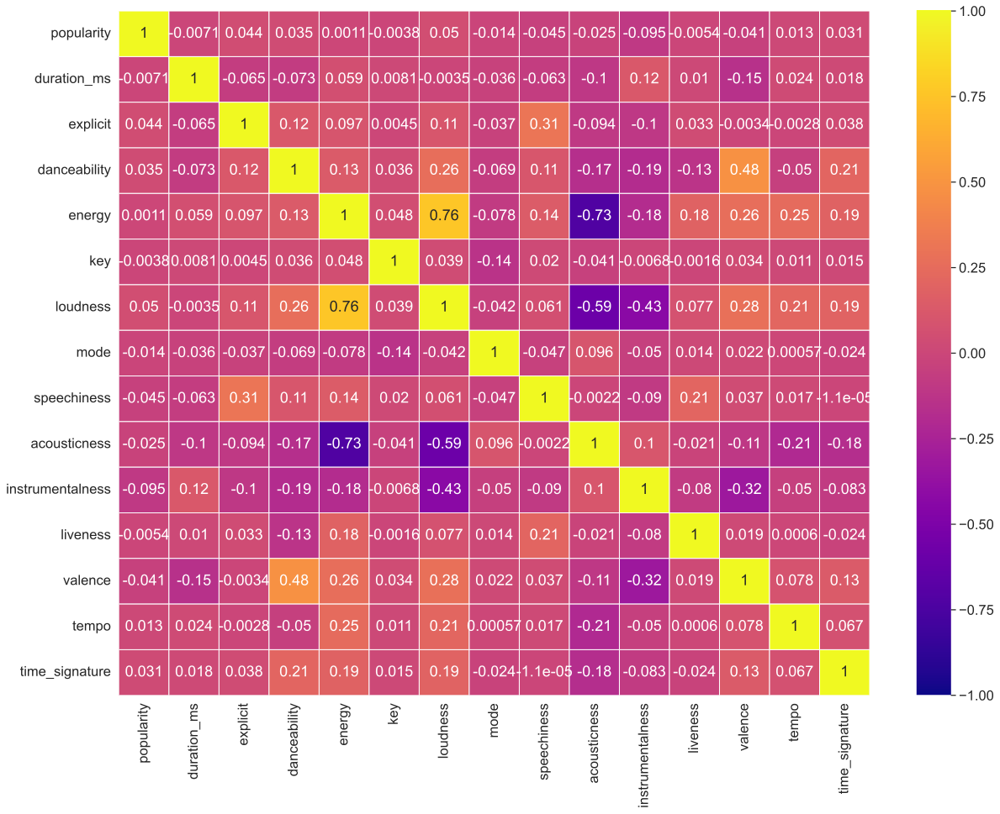

In [51]:
plt.figure(figsize = (20,15))
sns.set(font_scale = 1.5)
sns.heatmap(corr_spotify, annot = True, cmap = 'plasma', vmin = -1, vmax = 1, linecolor = 'white', linewidths = 1)

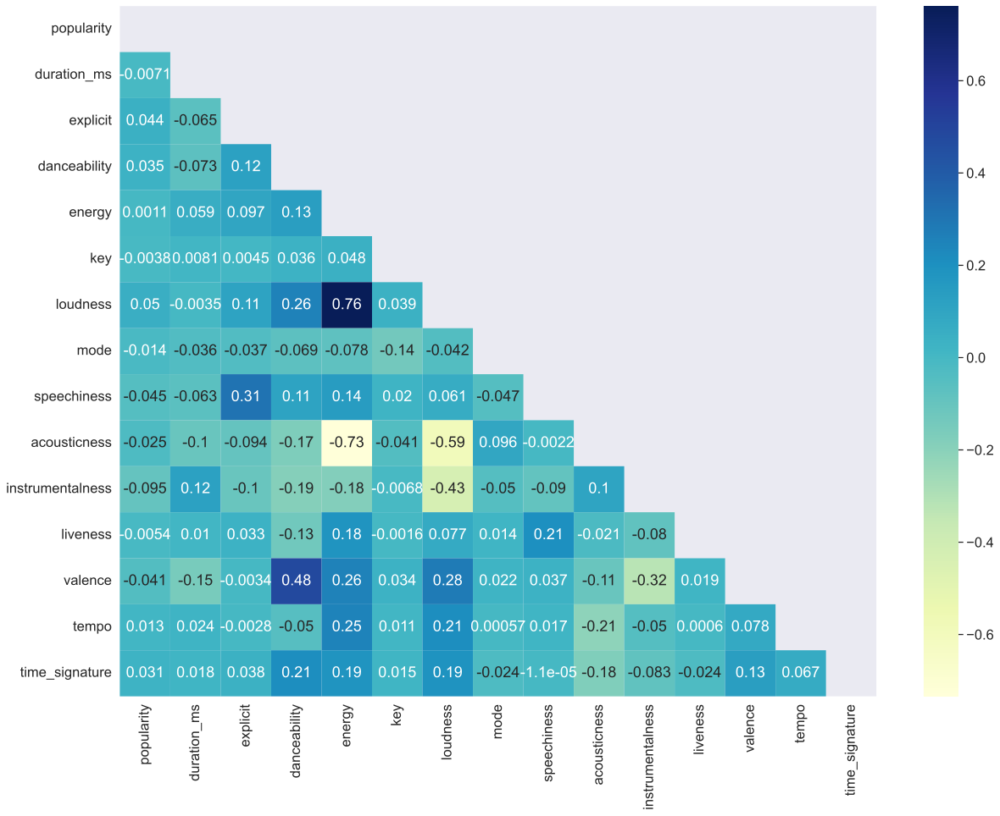

In [52]:
plt.figure(figsize = (20,15))
sns.set(font_scale = 1.5)

mask = np.triu(np.ones_like(spotify[spotify.columns].corr(), dtype=bool))
sns.heatmap(spotify[spotify.columns].corr(), annot=True, cmap="YlGnBu", mask=mask)
plt.show()

In [53]:
sns.set(font_scale = 1.5)
sns.pairplot(data = spotify, diag_kind = 'kde', palette = 'Set2')

Error in callback <function flush_figures at 0x7f9d90854280> (for post_execute):


KeyboardInterrupt: 

#### popularity vs loudness

<AxesSubplot: xlabel='popularity', ylabel='loudness'>

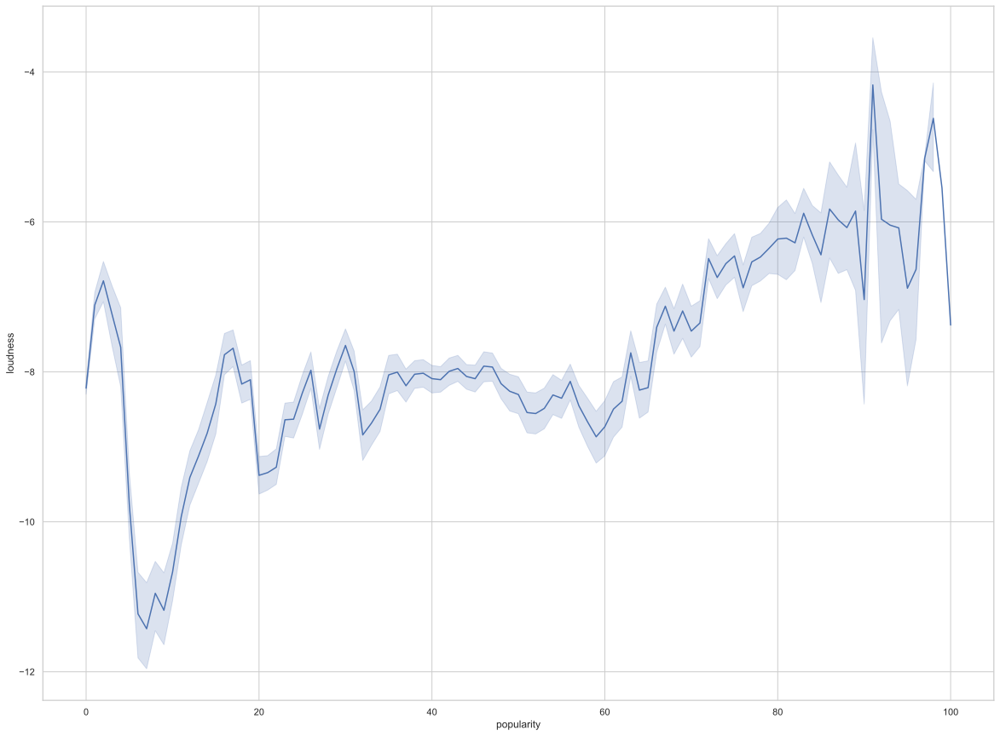

In [54]:
plt.figure(figsize = (20,15))
sns.set(font_scale = 1.5)
sns.set(style = "whitegrid")

sns.lineplot(x='popularity', y='loudness', data = spotify)

#### valence vs loudness

In [ ]:
sns.jointplot(x = 'valence', y = 'loudness', data = spotify, kind = 'reg', size =8, color = 'orange')

#### acousticness  vs danceability

In [ ]:
sns.jointplot(x = 'acousticness', y = 'danceability', data = spotify, kind = 'reg', size =8, color = 'red')

#### popularity vs energy

In [ ]:
sns.jointplot(x = 'popularity', y = 'energy', data = spotify, kind = 'reg', size =8, color = 'blue')

-------------------

### Saving the output to csv

In [ ]:
spotify.to_csv('spotify_data.csv', index=False)

----------------

# Step 3. Data Pre-processing

In [ ]:
spotify_new = pd.read_csv('spotify_data.csv')
spotify_new.head()

In [ ]:
spotify = spotify_new

### Remove unnecessary columns

In [ ]:
spotify = spotify.drop(['duration_ms', 'explicit', 'mode', 'time_signature'], axis=1)

### Genres combined

In [133]:
spotify['Genre_Combined'] = spotify.groupby(['track_id'])['track_genre'].transform(lambda x: ','.join(x))
spotify['Genre_Combined'] = spotify['Genre_Combined'].str.split(',')

In [134]:
spotify = spotify.drop_duplicates(subset=['track_id'])

In [135]:
spotify = spotify.drop_duplicates(subset=['track_name'])

In [ ]:
spotify.head()

In [ ]:
spotify.shape

In [ ]:
spotify.info()

### Scaling

In [ ]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
spotify_num = spotify.select_dtypes(include=numerics)
spotify_num.columns

####  Scale numerical features

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
spotify[spotify_num.columns] = pd.DataFrame(scaler.fit_transform(spotify_num), columns=spotify_num.columns)

In [ ]:
spotify.head()

In [ ]:
spotify.shape

In [ ]:
scaled_spotify = spotify

------------------------

### Saving the output to csv

In [ ]:
scaled_spotify.to_csv('scaled_spotify_data_model.csv', index=False)

------------------

## One Hot Encoding

In [ ]:
spotify_ohe = pd.read_csv('scaled_spotify_data_model.csv')

In [ ]:
mlb = MultiLabelBinarizer(sparse_output=True)
spotify_ohe = spotify_ohe.join(pd.DataFrame.sparse.from_spmatrix(mlb.fit_transform(spotify.pop('Genre_Combined')),
                                                           index=spotify.index,
                                                           columns=mlb.classes_))

In [ ]:
spotify_ohe = spotify_ohe.drop(columns = ['track_genre'])
spotify_ohe.dropna(subset=['acoustic'], inplace = True)

In [ ]:
spotify_ohe.head()

In [ ]:
spotify_ohe.shape

### Saving the output to csv

In [ ]:
spotify_ohe.to_csv('ohe_scaled_spotify_data_model.csv', index=False)

------------

# Step 4: Building Model

In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer

pd.set_option('display.max_columns', None)


#ignore warning messages 
import warnings
warnings.filterwarnings('ignore')

In [91]:
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from scipy import sparse

In [92]:
spotify_model = pd.read_csv('scaled_spotify_data_model.csv')
spotify_model_ohe = pd.read_csv('ohe_scaled_spotify_data_model.csv')

In [93]:
spotify_model.head(2)

,track_id,artists,album_name,track_name,popularity,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,track_genre,Genre_Combined
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,0.73,0.686294,0.461,0.090909,0.791392,0.148187,0.032329,0.000001,0.358,0.718593,0.361245,acoustic,"['acoustic', 'j-pop', 'singer-songwriter', 'so..."
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,0.55,0.426396,0.166,0.090909,0.597377,0.079067,0.927711,0.000006,0.101,0.268342,0.318397,acoustic,"['acoustic', 'chill']"


In [94]:
spotify_model_ohe.head(2)

,track_id,artists,album_name,track_name,popularity,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,Genre_Combined,acoustic,afrobeat,alt-rock,alternative,ambient,anime,black-metal,bluegrass,blues,brazil,breakbeat,british,cantopop,chicago-house,children,chill,classical,club,comedy,country,dance,dancehall,death-metal,deep-house,detroit-techno,disco,disney,drum-and-bass,dub,dubstep,edm,electro,electronic,emo,folk,forro,french,funk,garage,german,gospel,goth,grindcore,groove,grunge,guitar,happy,hard-rock,hardcore,hardstyle,heavy-metal,hip-hop,honky-tonk,house,idm,indian,indie,indie-pop,industrial,iranian,j-dance,j-idol,j-pop,j-rock,jazz,k-pop,kids,latin,latino,malay,mandopop,metal,metalcore,minimal-techno,mpb,new-age,opera,pagode,party,piano,pop,pop-film,power-pop,progressive-house,psych-rock,punk,punk-rock,r-n-b,reggae,reggaeton,rock,rock-n-roll,rockabilly,romance,sad,salsa,samba,sertanejo,show-tunes,singer-songwriter,ska,sleep,songwriter,soul,spanish,study,swedish,synth-pop,tango,techno,trance,trip-hop,turkish,world-music
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,0.73,0.686294,0.461,0.090909,0.791392,0.148187,0.032329,0.000001,0.358,0.718593,0.361245,"['acoustic', 'j-pop', 'singer-songwriter', 'so...",1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,0.55,0.426396,0.166,0.090909,0.597377,0.079067,0.927711,0.000006,0.101,0.268342,0.318397,"['acoustic', 'chill']",1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 1. Content-based recommender system.

### We will work with 40k observations

In [95]:
spot_mod = spotify_model.head(40000)
spot_mod.shape

(40000, 17)

#### features selection for recommendations

In [96]:
features = ['popularity', 'danceability', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

#### Create a string of all the features for each track

In [97]:
spot_mod['features'] = spot_mod[features].apply(lambda x: ' '.join(x.astype(str)), axis=1)

#### Vectorize the features

In [98]:
vectorizer = CountVectorizer().fit_transform(spot_mod['features'])

#### Compute cosine similarity between all tracks

In [ ]:
cosine_similarities = cosine_similarity(vectorizer)

In [ ]:
def get_recommendations(track_id, cosine_similarities=cosine_similarities):
    # Get the index of the track with the given ID
    idx = spot_mod[spot_mod['track_id'] == track_id].index[0]
    
    # Get the cosine similarities between the given track and all other tracks
    sim_scores = list(enumerate(cosine_similarities[idx]))
    
    # Sort the tracks by their similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the top 10 most similar tracks
    sim_scores = sim_scores[1:11]
    
    # Get the indices and titles of the top 10 most similar tracks
    track_indices = [i[0] for i in sim_scores]
    track_names = spot_mod['track_name'].iloc[track_indices].values
    track_id = spot_mod['track_id'].iloc[track_indices].values
    genre = spot_mod['Genre_Combined'].iloc[track_indices].values
    
    # Create a DataFrame with the track names and similarity scores as columns
    recommendations_df = pd.DataFrame({'track_id': track_id, 'track_name': track_names, 'genre': genre, 'similarity_score': [i[1] for i in sim_scores]})
    
    # Return the DataFrame
    return recommendations_df

#### get recommendations for track with ID

In [ ]:
get_recommendations('4qPNDBW1i3p13qLCt0Ki3A')

,track_id,track_name,genre,similarity_score
0,2cuPD2epKOW51aapIlMEak,9 Variations on ‘Lison dormait’ from ‘Julie’ b...,['classical'],0.273861
1,3d8kYb3GqZkiHb6annxKEo,Swimmers,['acoustic'],0.261116
2,4Vfgc4BdSKM2hRlkaRFc9C,Bring It On Home To Me,['blues'],0.261116
3,2HXP76Wr3Cj2MlUQVa80Zi,Vem Ver (Ao Vivo),"['brazil', 'r-n-b', 'reggae']",0.261116
4,10d4n3B7NOZxxPs2uEBIDE,"Noëls sur les instruments, H 531, 534: 1. Vous...","['british', 'classical']",0.261116
5,3M01ewRy7GgG7JkSjy9EqN,Mad,['british'],0.261116
6,4bhstP5EAtJRiKOlkJZrW7,Eu Me Apaixonei Pela Morena,['forro'],0.261116
7,5brs9JsOe5Dx0joPjr8zjN,The Bed Is Burning,['grindcore'],0.261116
8,4vBk67mVsxz5tZ1LMMTkd9,Fogo (Adubado),['afrobeat'],0.250000
9,4N7h4IHWRaJCOo1VFdTMHV,Truman Sleeps,['ambient'],0.250000


In [ ]:
get_recommendations('5SuOikwiRyPMVoIQDJUgSV')

,track_id,track_name,genre,similarity_score
0,15gcqcGzUYF56VI0GgpOYH,Mala,['guitar'],0.273861
1,63QsFC6m0CaTw2gU0iZa7N,Conrad,['british'],0.261116
2,2A9l1TsM78JQqQMYqAQEZe,Red Lights (feat. Wale),['chill'],0.261116
3,1gCQSac65SXFh7FPW6MQz3,Cry 4 U - Sheryl's Authentic Love Festival Mix,['detroit-techno'],0.261116
4,5JnK6FSCbpoTAXMULIpTi8,Zochrot,['grindcore'],0.261116
5,6mmyRIjtOmYDYxaFRDByfY,Blood,['afrobeat'],0.250000
6,1M0RL0QLS6P25NwhPwOKaE,All wit My Hands,['alternative'],0.250000
7,4uaRUpAdVcjF5ME0QoZfuG,"12 Variations in C Major on ""Ah, vous dirai-je...",['classical'],0.250000
8,5cBCQJtvj9PThDtnLx6HM4,My Naffew Randy,['detroit-techno'],0.250000
9,4LfGDWBS4Mlt9mBPVzr99o,New Orleans,['drum-and-bass'],0.250000


In [ ]:
get_recommendations('1EzrEOXmMH3G43AXT1y7pA')

,track_id,track_name,genre,similarity_score
0,6fD8ugOa1yUsW8lGnLFSCZ,308,['death-metal'],0.213201
1,0UK44t60tDM37GEAETglwp,Gårdakvarnar och skit (Live),['goth'],0.213201
2,1txGe6o7tZRqifxZ7daYXv,Another Day - Extended Mix,['happy'],0.213201
3,6FUZY1855hKvmtVRkzpWPC,Laat Maar Waaien,"['happy', 'hardcore']",0.204124
4,3CEntclq2oGD3AkwWsoTgJ,Cria Em Mim - Ao Vivo,"['brazil', 'gospel']",0.125000
5,0YG5wOXVpvNUyPihvr1zsa,To Risk to Live,['acoustic'],0.117851
6,5TMgvUss7jcR3HSdMUP9Cf,Club Tonight - Cara B,['afrobeat'],0.117851
7,2vGDTOtslhkco6LVFfdEI2,Black Hole Sun,"['alt-rock', 'alternative', 'grunge', 'hard-ro...",0.117851
8,3gpgMfFAQDkVgcY1u76Ccx,Hola Noviembre,['alt-rock'],0.117851
9,6Xs9eaQXZaKfPkEyETxNl6,Night,['ambient'],0.117851


In [ ]:
recommendations_df =get_recommendations('6Xs9eaQXZaKfPkEyETxNl6')

print(f"Recommendations for track '{spot_mod[spot_mod['track_id']=='6fD8ugOa1yUsW8lGnLFSCZ']['track_name'].values[0]}' ({'6fD8ugOa1yUsW8lGnLFSCZ'}):")
recommendations_df[['track_name', 'genre', 'similarity_score']]

Recommendations for track '308' (6fD8ugOa1yUsW8lGnLFSCZ):


,track_name,genre,similarity_score
0,Yo Darlin',['dancehall'],0.222222
1,God I Look to You,"['ambient', 'world-music']",0.210819
2,Dark Hollow,['bluegrass'],0.210819
3,Delitfol,['drum-and-bass'],0.210819
4,Erilaisen rakkauden todistaja,['heavy-metal'],0.210819
5,Neck Breakers,['dancehall'],0.201008
6,Knights Forever,['garage'],0.192450
7,I'm Yours,"['acoustic', 'rock']",0.117851
8,Good night,"['acoustic', 'j-pop', 'j-rock']",0.117851
9,Cria Em Mim - Ao Vivo,"['brazil', 'gospel']",0.117851


#### Because content-based recommendation is not a supervised learning model, no standard evaluation metric such as accuracy, precision, recall, or F1-score applies. 

#### Alternatively, we may assess the model's performance by manually deciding if the recommendations it offers for a given track are relevant and useful.

-------------

### We wanted to explore if there is any difference in recommendations after one hot encoding

In [99]:
spot_mod_ohe = spotify_model_ohe.head(40000)
spot_mod_ohe.shape

(40000, 130)

#### select all the features in the dataset excluding 'track_id', 'track_name', 'artists', 'album_name','Genre_Combined'

In [100]:
features_ohe = spot_mod_ohe.columns.difference(['track_id', 'track_name', 'artists', 'album_name','Genre_Combined'])
len(features_ohe)

125

#### Create a string of all the features for each track

In [ ]:
spot_mod_ohe['features_ohe'] = spot_mod_ohe[features_ohe].apply(lambda x: ' '.join(x.astype(str)), axis=1)

#### Vectorize the features

In [ ]:
vectorizer_ohe = CountVectorizer().fit_transform(spot_mod_ohe['features_ohe'])

#### Compute cosine similarity between all tracks

In [ ]:
cosine_similarities_ohe = cosine_similarity(vectorizer_ohe)

In [ ]:
def get_recommendations_ohe(track_id, cosine_similarities=cosine_similarities_ohe):
    # Get the index of the track with the given ID
    idx = spot_mod_ohe[spot_mod_ohe['track_id'] == track_id].index[0]
    
    # Get the cosine similarities between the given track and all other tracks
    sim_scores = list(enumerate(cosine_similarities[idx]))
    
    # Sort the tracks by their similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the top 10 most similar tracks
    sim_scores = sim_scores[1:11]
    
    # Get the indices and titles of the top 10 most similar tracks
    track_indices = [i[0] for i in sim_scores]
    track_names = spot_mod_ohe['track_name'].iloc[track_indices].values
    track_id = spot_mod_ohe['track_id'].iloc[track_indices].values
    genre = spot_mod_ohe['Genre_Combined'].iloc[track_indices].values
    
    recommendations_df = pd.DataFrame({'track_id': track_id, 'track_name': track_names, 'genre': genre, 'similarity_score': [i[1] for i in sim_scores]})
    
    return recommendations_df

In [ ]:
get_recommendations_ohe('4qPNDBW1i3p13qLCt0Ki3A')

,track_id,track_name,genre,similarity_score
0,2cuPD2epKOW51aapIlMEak,9 Variations on ‘Lison dormait’ from ‘Julie’ b...,['classical'],0.273861
1,3d8kYb3GqZkiHb6annxKEo,Swimmers,['acoustic'],0.261116
2,4Vfgc4BdSKM2hRlkaRFc9C,Bring It On Home To Me,['blues'],0.261116
3,2HXP76Wr3Cj2MlUQVa80Zi,Vem Ver (Ao Vivo),"['brazil', 'r-n-b', 'reggae']",0.261116
4,10d4n3B7NOZxxPs2uEBIDE,"Noëls sur les instruments, H 531, 534: 1. Vous...","['british', 'classical']",0.261116
5,3M01ewRy7GgG7JkSjy9EqN,Mad,['british'],0.261116
6,4bhstP5EAtJRiKOlkJZrW7,Eu Me Apaixonei Pela Morena,['forro'],0.261116
7,5brs9JsOe5Dx0joPjr8zjN,The Bed Is Burning,['grindcore'],0.261116
8,4vBk67mVsxz5tZ1LMMTkd9,Fogo (Adubado),['afrobeat'],0.250000
9,4u4yBJmIws6XF0bfJx12tA,Ceremony for the Gathering of Death,['black-metal'],0.250000


In [ ]:
get_recommendations_ohe('5SuOikwiRyPMVoIQDJUgSV')

,track_id,track_name,genre,similarity_score
0,15gcqcGzUYF56VI0GgpOYH,Mala,['guitar'],0.273861
1,63QsFC6m0CaTw2gU0iZa7N,Conrad,['british'],0.261116
2,2A9l1TsM78JQqQMYqAQEZe,Red Lights (feat. Wale),['chill'],0.261116
3,6mmyRIjtOmYDYxaFRDByfY,Blood,['afrobeat'],0.250000
4,1M0RL0QLS6P25NwhPwOKaE,All wit My Hands,['alternative'],0.250000
5,5cBCQJtvj9PThDtnLx6HM4,My Naffew Randy,['detroit-techno'],0.250000
6,4LfGDWBS4Mlt9mBPVzr99o,New Orleans,['drum-and-bass'],0.250000
7,5RHEWqyahElZpVulOa10t8,The River and the Mountain,['guitar'],0.250000
8,64D3mSyqF6wwuxkdOeQmbl,The Triumph of King Freak (A Crypt of Preserva...,['industrial'],0.250000
9,4RTTcgwT6FXqDEWdraGb2n,ようこそ!イコラブ沼,['j-idol'],0.240192


In [ ]:
get_recommendations_ohe('1EzrEOXmMH3G43AXT1y7pA')

,track_id,track_name,genre,similarity_score
0,6fD8ugOa1yUsW8lGnLFSCZ,308,['death-metal'],0.213201
1,1txGe6o7tZRqifxZ7daYXv,Another Day - Extended Mix,['happy'],0.213201
2,6FUZY1855hKvmtVRkzpWPC,Laat Maar Waaien,"['happy', 'hardcore']",0.204124
3,4WV73uVSyGORPU6orKLvlg,Make Great Mistaks,['kids'],0.125000
4,44XjoNvtwevktFKjvVe1vH,Andrea,"['latino', 'reggaeton']",0.125000
5,0YG5wOXVpvNUyPihvr1zsa,To Risk to Live,['acoustic'],0.117851
6,5TMgvUss7jcR3HSdMUP9Cf,Club Tonight - Cara B,['afrobeat'],0.117851
7,2vGDTOtslhkco6LVFfdEI2,Black Hole Sun,"['alt-rock', 'alternative', 'grunge', 'hard-ro...",0.117851
8,3gpgMfFAQDkVgcY1u76Ccx,Hola Noviembre,['alt-rock'],0.117851
9,6IWumNs0oyQfa8mLd5rjcn,Voila!,['bluegrass'],0.117851


------------------------

# 2. Popularity-based recommender system

In [144]:
spotify['genre'] = [','.join(map(str, l)) for l in spotify['Genre_Combined']]

In [147]:
#item_popularity = spotify.groupby(['track_id','artists','track_name'])['popularity'].mean().reset_index()
item_popularity = spotify.sort_values('popularity', ascending=False)
top_items = item_popularity.head(10)

## top 10 most popular tracks

In [150]:
top_items[['artists', 'track_name','Genre_Combined','popularity']]

,artists,track_name,Genre_Combined,popularity
20001,Sam Smith;Kim Petras,Unholy (feat. Kim Petras),"[dance, pop]",100
51664,Bizarrap;Quevedo,"Quevedo: Bzrp Music Sessions, Vol. 52",[hip-hop],99
20008,David Guetta;Bebe Rexha,I'm Good (Blue),"[dance, edm, pop]",98
67356,Manuel Turizo,La Bachata,"[latin, latino, reggae, reggaeton]",98
67359,Bad Bunny,Tití Me Preguntó,"[latin, latino, reggae, reggaeton]",97
67358,Bad Bunny;Chencho Corleone,Me Porto Bonito,"[latin, latino, reggae, reggaeton]",97
79000,OneRepublic,I Ain't Worried,"[piano, pop, rock]",96
67559,Bad Bunny,Efecto,"[latin, latino, reggae, reggaeton]",96
67500,Bad Bunny;Bomba Estéreo,Ojitos Lindos,"[latin, latino, reggae, reggaeton]",95
67603,Bad Bunny,Moscow Mule,"[latin, latino, reggae, reggaeton]",94


## top 10 most popular 'classical' genre tracks

In [116]:
spot_mod.track_genre.unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm'],
      dtype=object)

In [114]:
classical_tracks = item_popularity[item_popularity['Genre_Combined'].apply(lambda x: 'classical' in x)]
top_classical_tracks = classical_tracks.head(10)
top_classical_tracks[['track_id','artists', 'track_name', 'Genre_Combined']]

,track_id,artists,track_name,Genre_Combined
27465,5N7EGcJp355QVIUsISLXXX,Maurice Ravel;Duo Synopsis,"Sonata for Violin and Cello in C Major, M. 73:...",['classical']
22988,4UsNNKzfrPBp3np4Eiznat,Kumar Gandharva,Uthi Uthi Gopala,['classical']
11181,2C9ZfqsCQ2bSI51q4uJHaU,Wolfgang Amadeus Mozart;Florian Birsak,"Modulating Prelude, K.284a/2","['classical', 'classical']"
12711,2UscVwaSo0fbaX5QxVgqH8,Jiří Horák,Hourglass,['classical']
23868,4eytLZ543ZiGAEs55xd0Ww,Sirkazhi G. Sivachidambaram,Murugane - Gsivachidambaram,['classical']
19301,3lIefB8ZiKOmxk7fRlPZtI,Philadelphia Orchestra;Eugene Ormandy,"The Nutcracker, Op. 71, Act II, Scene 3: No. 1...",['classical']
16108,38znqxzVreO8WnoEkBIAJI,Wolfgang Amadeus Mozart;Academy of St. Martin ...,"Symphony No. 22 in C, K.162: 3. Presto assai","['classical', 'classical']"
12758,2VMOoFwSgDRJoNq4n3s93u,Mahesh Raghvan,Harry Potter (The Ultimate Indian Theme),['classical']
8692,1htyTZxRyirh8rEa8dvIOq,Bhimsen Joshi,Majha Bhav Tujhe Charani,['classical']
24519,4nakDBdFLfwVoWCvvsFskf,Wolfgang Amadeus Mozart;Danielle Laval,12 Variations on ‘La belle Françoise’ in E fla...,['classical']


## top 10 most popular 'hard-rock' genre tracks

In [118]:
hard_rock_items = item_popularity[item_popularity['Genre_Combined'].apply(lambda x: 'alternative' in x)]
hard_rock_items = hard_rock_items.head(10)
hard_rock_items[['track_id','artists', 'track_name', 'Genre_Combined']]

,track_id,artists,track_name,Genre_Combined
10038,1yZWmKmLfTrFCxHvhFsdoN,The Killers;Phoebe Bridgers,Runaway Horses - Abridged,"['alt-rock', 'alternative', 'rock']"
31819,6CmuT4GB0mCTviUq2jB9Fe,Joy Division,Atmosphere,"['alt-rock', 'alternative', 'punk-rock', 'punk']"
2294,0S51NLrTscfLemwPv2rjNv,No Doubt,Just A Girl,"['alt-rock', 'alternative']"
38041,7cEZSmCRCiOU1nsCuAtx0F,Weezer,Island In The Sun,"['alt-rock', 'alternative', 'power-pop', 'rock']"
12465,2RsAajgo0g7bMCHxwH3Sk0,Nirvana,Come As You Are,"['alt-rock', 'alternative', 'grunge', 'rock']"
7693,1Vl9pXCmq6m2FbpxqHptTY,The Smashing Pumpkins,Bullet With Butterfly Wings - Remastered 2012,"['alt-rock', 'alternative', 'grunge', 'metal']"
25391,4xnB2yGAeXOuR3kJ9KTD3b,Red Hot Chili Peppers,Nerve Flip,"['alt-rock', 'alternative', 'funk', 'metal', '..."
20290,3y4AS6cTOQBTnEsTbOUtIg,Andrés Calamaro;Juanes;Niño Josele,Enganchate Conmigo,"['alt-rock', 'alternative', 'latin', 'rock']"
24570,4o7qQwLjPPwXNNSTax6yWr,Los Abuelos De La Nada,Lunes Por La Madrugada,"['alt-rock', 'alternative', 'punk-rock', 'punk..."
27867,5SDcksP8En1l6RtTY1wzHc,Hillsong UNITED;TAYA,Oceans (Where Feet May Fail),"['alt-rock', 'alternative']"


## Show Popualrity Scores

In [ ]:
hard_rock = spot_mod[spot_mod['Genre_Combined'].apply(lambda x: 'hard-rock' in x)]

#### Group by track and calculate mean popularity score

In [ ]:
item_popularity = hard_rock.groupby(['track_id', 'track_name', 'Genre_Combined'])['popularity'].mean().reset_index()
item_popularity = item_popularity.sort_values('popularity', ascending=False)

In [ ]:
top_hard_rock = item_popularity.head(10)
top_hard_rock[['track_id', 'track_name', 'Genre_Combined', 'popularity']]

,track_id,track_name,Genre_Combined,popularity
504,532WuZy5kwDhU8iNUbLKQK,Pra Não Dizer Que Não Falei Das Flores,"['hard-rock', 'r-n-b']",0.96
50,0QwZfbw26QeUoIy82Z2jYp,Good Times Bad Times - 1993 Remaster,['hard-rock'],0.95
742,7Fhr46PhABM7LdDVLeucUP,Hoje Eu Só Procuro A Minha Paz,"['hard-rock', 'r-n-b']",0.93
355,3RtP7chdHFagVWsEmi1yux,Be Myself,"['hard-rock', 'r-n-b']",0.91
657,6WE7jSshLCuVKoCmobVKVf,Heartbreaker - 1990 Remaster,['hard-rock'],0.91
669,6cpbVrZueaJIklHRs9cGFI,Phunky Buddha,"['hard-rock', 'punk-rock', 'punk']",0.91
153,1XXp1AY5XKaHIgn6huNzvP,O Lobo,['hard-rock'],0.90
560,5a0bHLSL5t4eRNKjmh9PyV,Tão Iguais,"['hard-rock', 'hardcore', 'punk-rock']",0.90
148,1SkwlmVJaqikct9OqPPn78,O Cidadão Do Mundo,['hard-rock'],0.89
78,0gkWw8Cx8D9f9wNhNMBy59,"Ritmo, Ritual E Responsa",['hard-rock'],0.89


-----------------------------------------

# Step 5: Model Evaluation

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from math import sqrt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

### We will work with 10k observations

In [ ]:
spot_mod_head = spotify_model.head(10000)
spot_mod_head.head(2)

,track_id,artists,album_name,track_name,popularity,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,track_genre,Genre_Combined
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,0.73,0.686294,0.461,0.090909,0.791392,0.148187,0.032329,0.000001,0.358,0.718593,0.361245,acoustic,"['acoustic', 'j-pop', 'singer-songwriter', 'so..."
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,0.55,0.426396,0.166,0.090909,0.597377,0.079067,0.927711,0.000006,0.101,0.268342,0.318397,acoustic,"['acoustic', 'chill']"


In [ ]:
recomm_list = []
for i in range(len(spot_mod_head)):
    recomm_i = get_recommendations(spot_mod_head['track_id'][i])
    recomm_list.append(recomm_i['track_name'])

In [ ]:
recomm_list1 = pd.DataFrame(recomm_list)
recomm_list1 = recomm_list1.rename(columns={0: 'First Recommendation', 1: 'Second Recommendation', 2: 'Third Recommendation', 3: 'Fourth Recommendation', 4: 'Fifth Recommendation', 5: 'Sixth Recommendation', 6: 'Seventh Recommendation', 7: 'Eighth Recommendation', 8: 'Ninth Recommendation', 9: 'Tenth Recommendation'})

In [ ]:
recomm_list1 = recomm_list1.rename(columns={'track_name': 'original_track_name'})
recomm_list1.insert(0, 'TRACK NAME', spot_mod_head['track_name'].values)

In [ ]:
recomm_data = recomm_list1[['TRACK NAME','First Recommendation','Second Recommendation','Third Recommendation','Fourth Recommendation','Fifth Recommendation', 'Sixth Recommendation', 'Seventh Recommendation', 'Eighth Recommendation', 'Ninth Recommendation', 'Tenth Recommendation']]

In [ ]:
recomm_data.head(10)

,TRACK NAME,First Recommendation,Second Recommendation,Third Recommendation,Fourth Recommendation,Fifth Recommendation,Sixth Recommendation,Seventh Recommendation,Eighth Recommendation,Ninth Recommendation,Tenth Recommendation
track_name,Comedy,Mala,Conrad,Red Lights (feat. Wale),Cry 4 U - Sheryl's Authentic Love Festival Mix,Zochrot,Blood,All wit My Hands,"12 Variations in C Major on ""Ah, vous dirai-je...",My Naffew Randy,New Orleans
track_name,Ghost - Acoustic,9 Variations on ‘Lison dormait’ from ‘Julie’ b...,Swimmers,Bring It On Home To Me,Vem Ver (Ao Vivo),"Noëls sur les instruments, H 531, 534: 1. Vous...",Mad,Eu Me Apaixonei Pela Morena,The Bed Is Burning,Fogo (Adubado),Truman Sleeps
track_name,To Begin Again,Perfect,Agarra Mi Mano,Air I Breathe - Sub Focus & Wilkinson,Fool for Your Loving,Aos Pés Da Cruz - Ao Vivo,天真,The Only One,Everything Must Change,Mur,Paradigms Warped
track_name,Can't Help Falling In Love,Heaven,Smoothie Song,Bullseye,"Call It Fate, Call It Karma",Halayo,Solución Suicida,Super Potato's Theme,"Sonate, Op. 5: IV. (Allegro)",Bhaja Govindam,Crowded Room
track_name,Hold On,Ocidentes Acontecem,School Rooftop,Pure Hatred,Bogotá (Instrumental),Runaway Horses - Abridged,Four Dimensions,驗孕的下晝 - Live,Nite Roads,Feel The Rhythm,Opening Remarks and a Request
track_name,Days I Will Remember,Kiss Me In Berlin,Saddle Road,Dedo Nucué,Dram,Prey,The Sound of Silence,Shellstar,Wyjcie Psy,Lost Dog,Rap du Bom Parte II - Mús. Incid.: Odara
track_name,Say Something,Full Tank - Edit,Are You Behind the Shining Star?,The Darkness That You Fear,Atlantis (Super Sped Up),Elusive Reaches,go if you want to,Little Sin,Count On Me (Cuenta Conmigo),Garota Comunista,Just You and Me
track_name,I'm Yours,308,Gårdakvarnar och skit (Live),Another Day - Extended Mix,Laat Maar Waaien,Cria Em Mim - Ao Vivo,To Risk to Live,Club Tonight - Cara B,Black Hole Sun,Hola Noviembre,Night
track_name,Lucky,Running from the Thoughts,Yaz Günü,The Reason - Acoustic,Quebrou a Cara,Rodrigo: Concierto de Aranjuez: II. Adagio (Ex...,Crosstitution,Copperhead Road,8-Track,No Way (feat. Darius Scott),Vento No Litoral
track_name,Hunger,"Le carnaval des animaux, R. 125: IV. Tortues -...","Symphony No. 5 in B flat, K.22: 3. Allegro molto",Verrat,Magma,A Colheita,Dizem - Ao Vivo,Trip to Ireland,The Story,The Resistance,Divenire


### Saving the recommendations to csv

In [ ]:
recomm_data.to_csv('content-based recommendations.csv', index=False)

#### split

In [ ]:
train_ids, test_ids = train_test_split(spot_mod_head['track_id'], test_size=0.2, random_state=11)

In [ ]:
rmse = 0


for track_id in test_ids:
    original_track_name = spot_mod_head[spot_mod_head['track_id'] == track_id]['track_name'].values[0]    
    
    recommended_track_names = get_recommendations(track_id)['track_name'].values
    
    # cosine similarity
    corpus = [original_track_name] + list(recommended_track_names)
    tfidf = TfidfVectorizer().fit_transform(corpus)
    cosine_sim = cosine_similarity(tfidf)[0][1:]
    
    # Add the squared distance to the RMSE
    rmse += (1 - cosine_sim.max()) ** 2

In [ ]:
rmse = sqrt(rmse / len(test_ids))
print("RMSE (cosine similarity): {:.2f}".format(rmse))

RMSE (cosine similarity): 0.97


-------------------

# Step 6. INSIGHTS

# Content-based recommender system

#### 1. Looking at the output of content-based recommedation system, the similarity scores for the recommended tracks are relatively low. This indicates that the our model is not be performing good in recommending tracks that are very similar to the input track_id. Furthermore, some of the recommended tracks have genres that are different from the input track.

#### 2. RMSE is a measure of the average deviation of the predicted values from the true values. Inour model, the RMSE value of 0.97 indicates that on average, the recommended track names are quite different from the original track names indicating that the model for recommending tracks based on cosine similarity may not be very effective.

#### 3. Also we need to consider that because content-based recommendation is not a supervised learning model, no standard evaluation metric such as accuracy, precision, recall, or F1-score may apply. Alternatively, we may assess the model's performance by manually deciding if the recommendations it offers for a given track are relevant and useful.

# Popularity-based recommender system

#### 1. The output shows the top 10 recommended tracks based on popularity score. The output also reveals that some tracks have numerous genres, indicating that the popularity score is determined based on the general popularity of the tracks rather than simply inside a certain genre.

#### 2. Overall, the popularity-based recommendation system is a straightforward and efficient method of recommending popular tracks. Unfortunately, it does not take into account the users' particular tastes and may not be suited for all users. Also, the algorithm may offer well-known popular tracks that users have already heard, resulting in a less personalized experience.

-------------------